In [ ]:
import cv2
import math
import PIL
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage.util import random_noise
from scipy import ndimage, datasets
import skimage

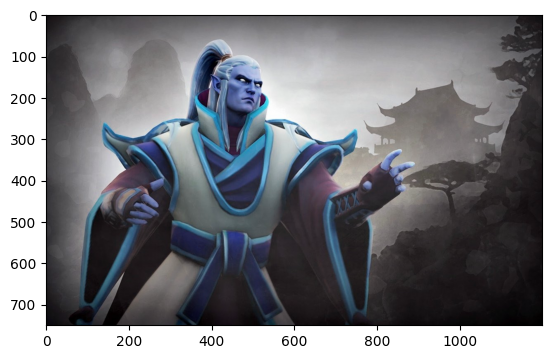

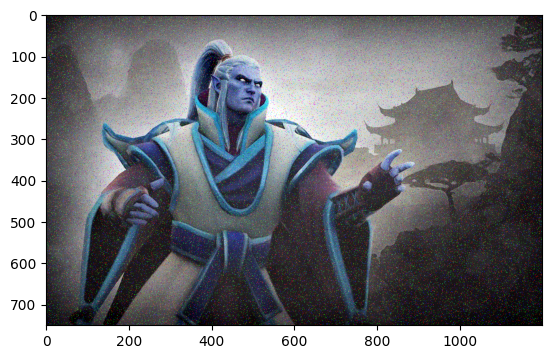

In [ ]:
#Импульсный шум При помощи библиотеки SciPy
imageObj = cv2.imread('обработка.jpg')
plt.imshow(imageObj)
plt.show()
NewImage_paper_salt = random_noise(image=imageObj, mode='s&p')
plt.imshow(NewImage_paper_salt)
plt.show()
plt.imsave('sample_image.png', NewImage_paper_salt)

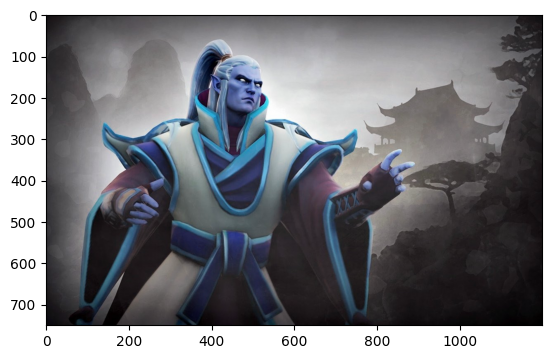

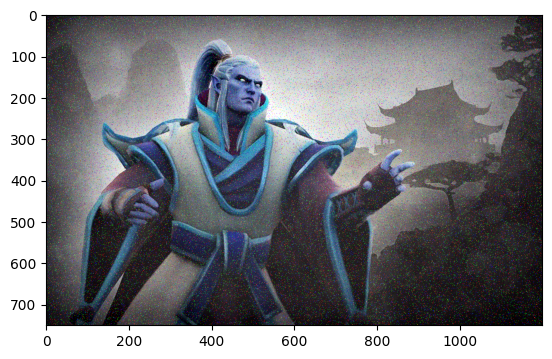

In [ ]:
# Noise parameter
imageObj = cv2.imread('обработка.jpg')
plt.imshow(imageObj)
plt.show()
d = 0.05
# Salat vs pepper distribution
s_vs_p = 0.5
# Generate radnom numbers
rng = np.random.default_rng()
vals = rng.random(imageObj.shape)
# Salt
I_out = np.copy(imageObj)
if I_out.dtype == np.uint8 :
  I_out[ vals < d * s_vs_p ] = 255
else :
  I_out[ vals < d * s_vs_p ] = 1.0
 # Pepper
I_out[ np.logical_and( vals >= d * s_vs_p , vals < d )] = 0
plt.imshow(I_out)
plt.show()

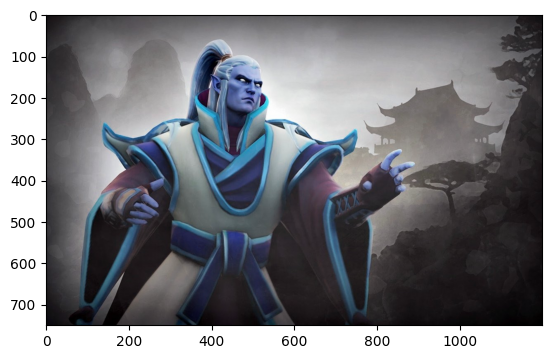

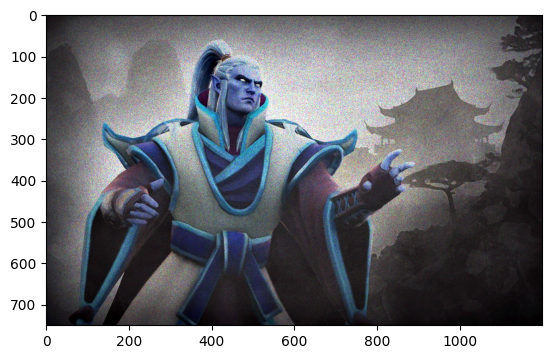

In [ ]:
#Аддитивный шум

imageObj = cv2.imread('обработка.jpg')
plt.imshow(imageObj)
plt.show()
# Variance parameter
var = 0.05
# Generate radnom numbers
rng = np.random.default_rng ()
gauss = rng.normal(0 , var ** 0.5 , imageObj.shape )
# Process uchar and float images separately
if imageObj.dtype == np.uint8 :
  I_f = imageObj.astype(np.float32)
  I_out = ( I_f + I_f * gauss ).clip(0 , 255).astype( np.uint8 )
else :
  I_out = imageObj + imageObj * gauss
plt.imshow(I_out)
plt.show()

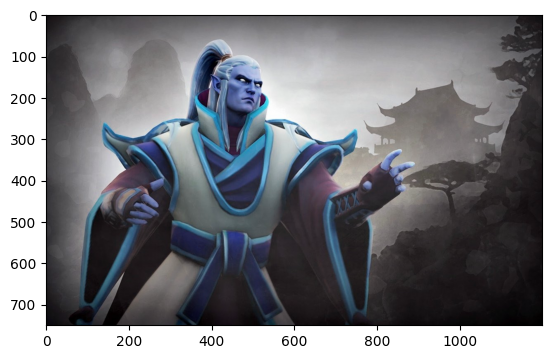

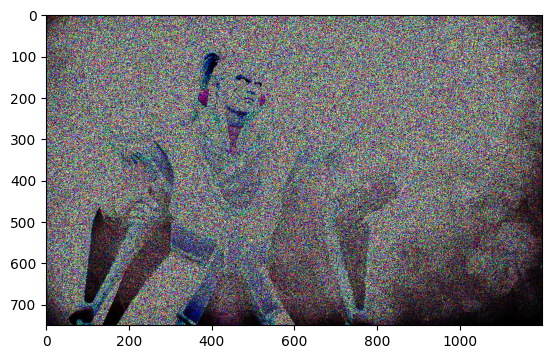

In [ ]:
#Мультипликативный шум
imageObj = cv2.imread('обработка.jpg')
plt.imshow(imageObj)
plt.show()
# Variance parameter
var = 0.05
# Generate radnom numbers
rng = np.random.default_rng ()
gauss = rng.normal(0 , var ** 0.5 , imageObj.shape )
# Process uchar and float images separately
if imageObj.dtype == np.uint8 :
  I_f = imageObj.astype(np.float32)
  I_out = ( I_f * I_f * gauss ).clip(0 , 255).astype( np.uint8 )
else :
  I_out = imageObj * imageObj * gauss
plt.imshow(I_out)
plt.show()

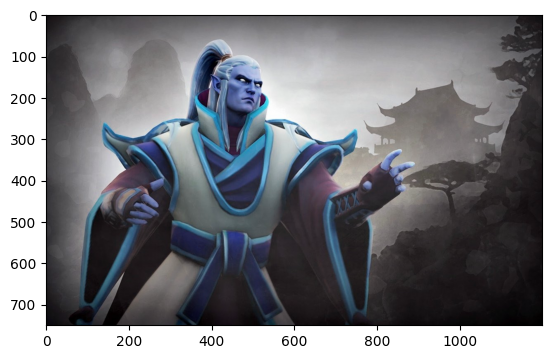

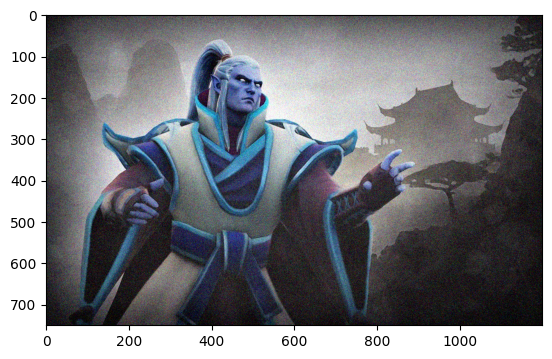

In [ ]:
#Гауссов нормальный шум При помощи библиотеки SciPy
imageObj = cv2.imread('обработка.jpg')
plt.imshow(imageObj)
plt.show()
NewImage = random_noise(image=imageObj, mode='gaussian')
plt.imshow(NewImage)
plt.show()
I_input = NewImage

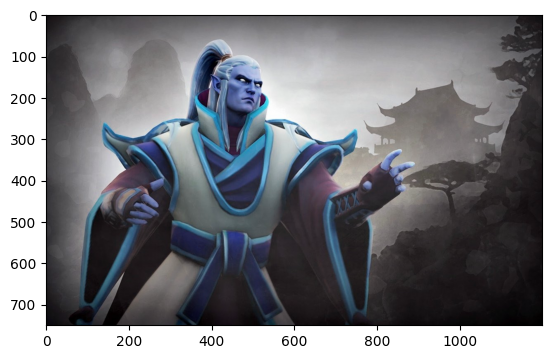

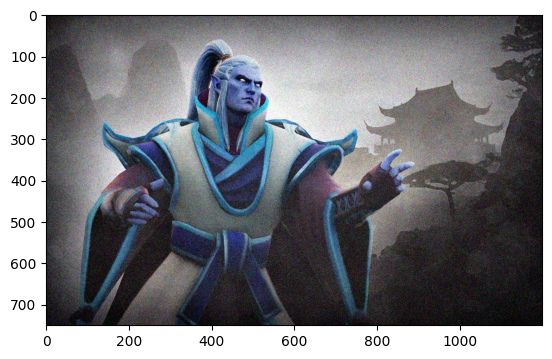

In [ ]:
#Гауссов нормальный шум
imageObj = cv2.imread('обработка.jpg')
plt.imshow(imageObj)
plt.show()
# Mean parameter
mean = 0
# Variance parameter
var = 0.01
# Generate radnom numbers
rng = np.random.default_rng()
gauss = rng.normal(mean , var ** 0.5 , imageObj.shape)
gauss = gauss.reshape (imageObj.shape)
# Process uchar and float images separately
if imageObj.dtype == np.uint8:
  I_out = ( imageObj.astype( np.float32 ) + gauss * 255).clip (0 , 255).astype(np.uint8)
else :
  I_out = ( imageObj + gauss ).astype(np.float32 )
plt.imshow(I_out)
plt.show()


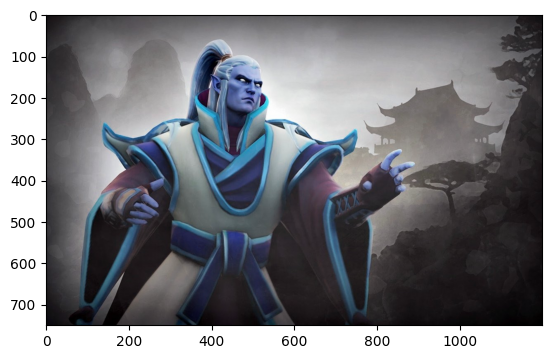

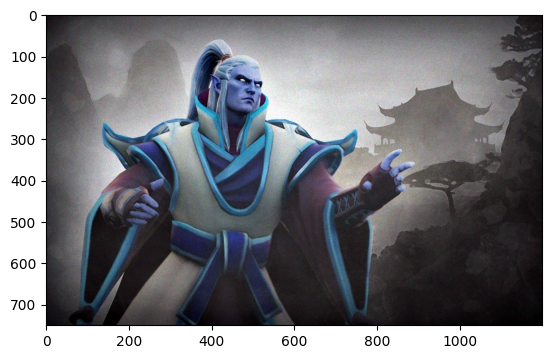

In [ ]:
#Шум квантования
imageObj = cv2.imread('обработка.jpg')
plt.imshow(imageObj)
plt.show()
rng = np.random.default_rng()
if imageObj.dtype == np.uint8:
  I_f = imageObj.astype(np.float32) / 255
  vals = len(np.unique(I_f))
  vals = 2 ** np.ceil(np.log2(vals))
  I_out = (255 * (rng.poisson(I_f*vals) / float(vals)).clip(0 , 1)).astype(np.uint8)
else :
  vals = len(np.unique(imageObj))
  vals = 2 ** np.ceil(np.log2(vals))
  I_out = rng.poisson(imageObj * vals) / float(vals)
plt.imshow(I_out)
plt.show()

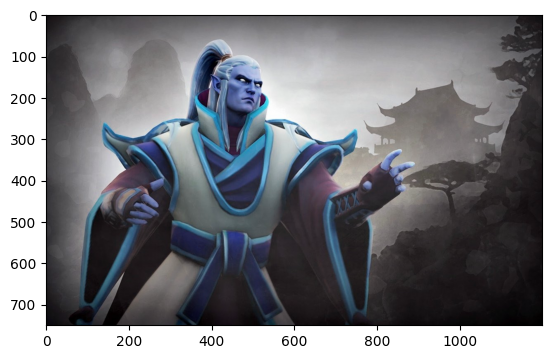

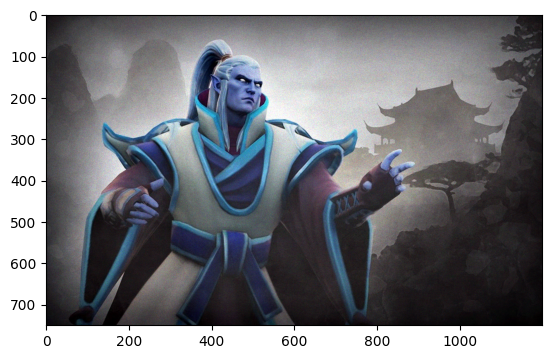

In [ ]:
#Пуассона(квантование) шум При помощи библиотеки SciPy
imageObj = cv2.imread('обработка.jpg')
plt.imshow(imageObj)
plt.show()
NewImage = random_noise(image=imageObj, mode='poisson')
plt.imshow(NewImage)
plt.show()


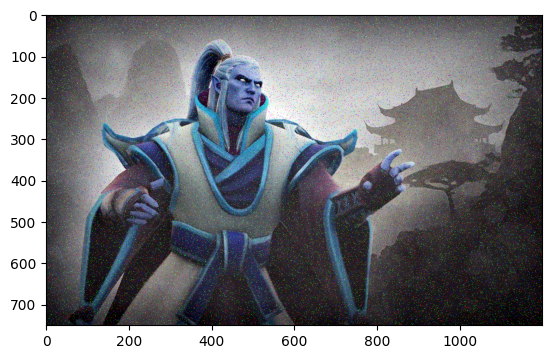

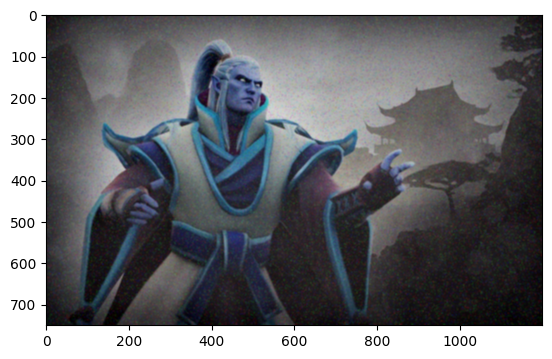

In [ ]:
#Низкочастотная фильтрация
#ВОзьмем искаженное изображение
plt.imshow(NewImage_paper_salt)
plt.show()
# mask = 1 / 10 * np.float64([[1, 1, 1], [1, 1, 1], [1, 1, 1]])
mask = np.ones((5, 5), np.float32)/30
I_out= cv2.filter2D(src = NewImage_paper_salt, ddepth=-1, kernel = mask)
plt.imshow(I_out)
plt.show()

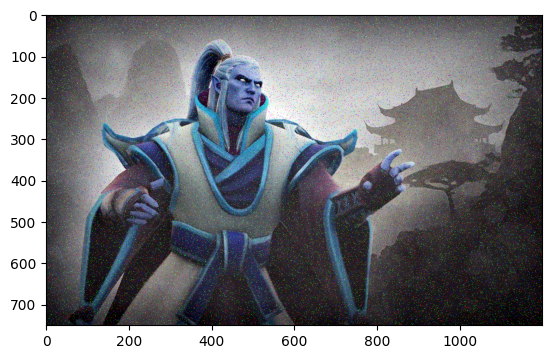

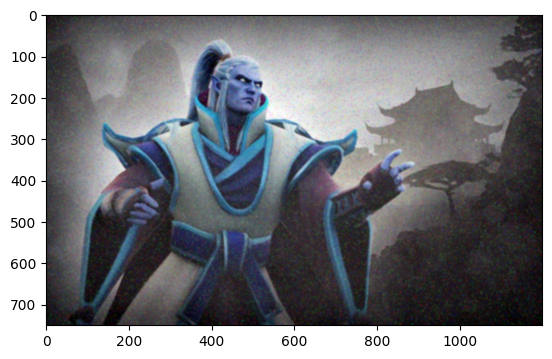

In [ ]:
#Арифметический усредняющий фильтр
plt.imshow(NewImage_paper_salt)
plt.show()
# mask = 1 / 10 * np.float64([[1, 1, 1], [1, 1, 1], [1, 1, 1]])
mask = np.ones((5, 5), np.float32)/30
I_out = cv2.blur(NewImage_paper_salt, (5, 5))
plt.imshow(I_out)
plt.show()

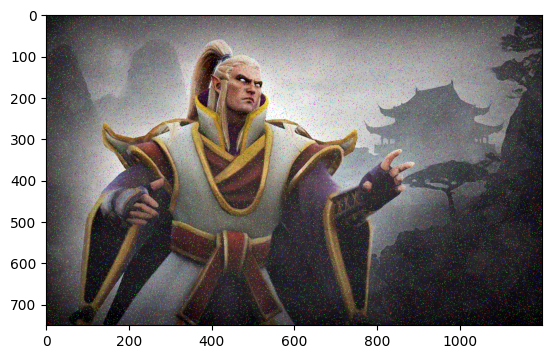

<ipython-input-11-f006b51fb6e2>:16: RuntimeWarning: divide by zero encountered in power
  znamen = np.clip(np.power(image_normal, Q), 0.0, 10)


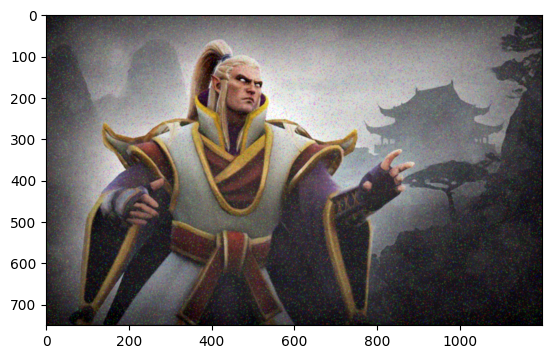

In [ ]:
def counterharmonic_filter(image, mask_size=3, Q=0):
    rows, cols = image.shape
    mask_sred = mask_size // 2
    coef_mask = 1 / mask_size ** 2
    image_icon = cv2.copyMakeBorder(
        image,
        top=mask_size // 2,
        bottom=mask_size // 2 + mask_size % 2,
        left=mask_size // 2,
        right=mask_size // 2 + mask_size % 2,
        borderType=cv2.BORDER_REPLICATE,
        value=[0.0, 0.0, 0.0])

    image_normal = np.clip(image / 255.0, 0.0, 1.0)
    image_icon_dop = np.zeros_like(image_icon, dtype=np.float64)
    znamen = np.clip(np.power(image_normal, Q), 0.0, 10)
    chislitel = np.clip(np.power(image_normal, Q + 1), 0.0, 10)
    for y in range(-mask_sred, mask_sred + mask_size % 2):
        for x in range(-mask_sred, mask_sred + mask_size % 2):
            image_icon_dop[mask_sred + y:mask_sred + rows + y,
            mask_sred + x:mask_sred + cols + x] += coef_mask * chislitel / znamen
    image_icon_dop = np.clip(image_icon_dop, 0.0, 1.0)
    image = image_icon_dop[mask_sred:rows+mask_sred, mask_sred:cols+mask_sred] * 255.0
    return image.astype(np.uint8)

image = cv2.imread("sample_image.png")
plt.imshow(image)
plt.show()
imagecopy = image
mask_size = 3
q = -0.5
filtered_image_1 = counterharmonic_filter(image[:,:,0], mask_size, q)
filtered_image_2 = counterharmonic_filter(image[:,:,1], mask_size, q)
filtered_image_3 = counterharmonic_filter(image[:,:,2], mask_size, q)
imagecopy[:,:,0] = filtered_image_1
imagecopy[:,:,1] = filtered_image_2
imagecopy[:,:,2] = filtered_image_3
plt.imshow(imagecopy)
plt.show()


Нелинейная Фильтрация


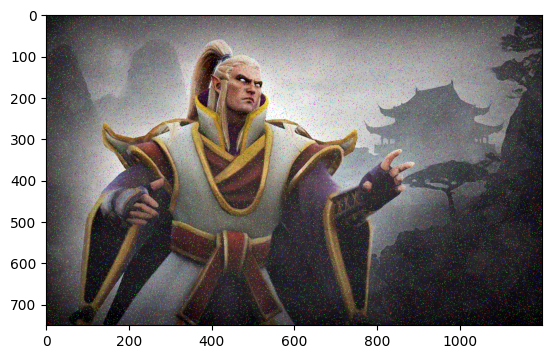

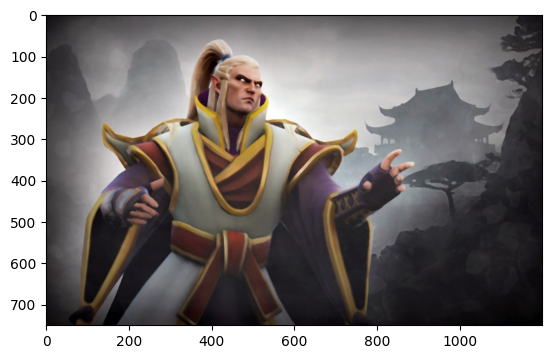

In [ ]:
#Медианная фильтрация
image = cv2.imread("sample_image.png")
plt.imshow(image)
plt.show()
I_out = cv2.medianBlur(image,5)
plt.imshow(I_out)
plt.show()

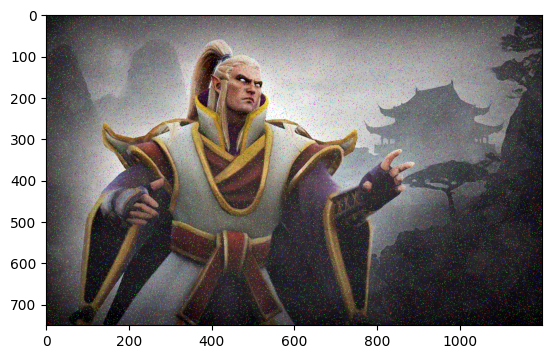

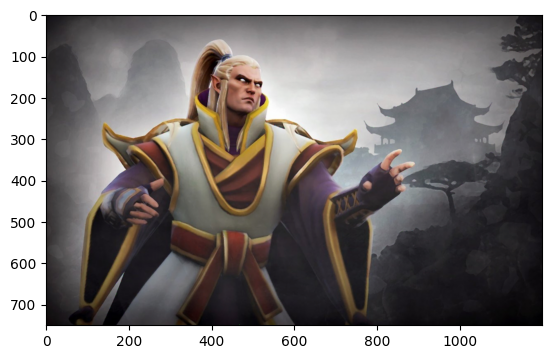

In [ ]:
#Ранговая фильтрация
image = cv2.imread("sample_image.png")
plt.imshow(image)
plt.show()

k_size = (3 , 3)
rank = 4
kernel = np.ones( k_size , dtype = np.float32)
rows , cols = image.shape [0:2]
# Convert to float
# and make image with border
if image.dtype == np.uint8 :
  I_copy = image.astype ( np.float32 ) / 255
else :
  I_copy = image
#Создадим рамку вокруг ищображения
I_copy = cv2.copyMakeBorder( I_copy ,
                            int(( k_size[0] - 1) / 2) ,
                             int( k_size[0] / 2) ,
                             int(( k_size[1] - 1) / 2) ,
                             int( k_size[1] / 2) ,
                             cv2.BORDER_REPLICATE )
# Fill arrays for each kernel item
I_layers = np.zeros( image.shape + ( k_size[0] * k_size[1], ) , dtype = np.float32)
if image.ndim == 2:
  for i in range ( k_size[0]):
    for j in range ( k_size[1]):
      I_layers [: , :, i * k_size[1] + j ] = \
      kernel [i , j ] *I_copy [ i : i + rows , j : j + cols ]
else :
  for i in range ( k_size[0]):
    for j in range ( k_size[1]):
      I_layers [: , :, : , i * k_size[1] + j ] = kernel[i , j ] * \
I_copy [ i : i + rows , j : j + cols , :]
# Sort arrays
I_layers.sort()
# Choose layer with rank
if image.ndim == 2:
  I_out = I_layers [: , : , rank ]
else :
  I_out = I_layers [: , : , : , rank ]

# Convert back to uint if needed
if ( image.dtype == np.uint8 ):
  I_out = (255 * I_out).clip(0 , 255).astype(np.uint8 )

plt.imshow(I_out)
plt.show()

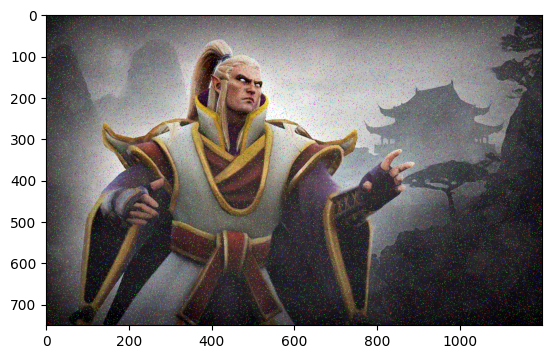

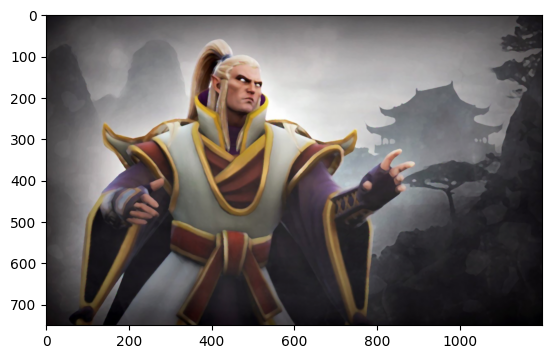

In [ ]:
#Ранговая фильтрация при помощи ScyPY

image = cv2.imread("sample_image.png")
plt.imshow(image)
plt.show()
rank = -10
kernel = np.ones((5,5),np.float64)
imagecopy = image
imagecopy[:,:,0] = ndimage.rank_filter(image[:,:,0], rank=rank, footprint=kernel)
imagecopy[:,:,1] = ndimage.rank_filter(image[:,:,1], rank=rank, footprint=kernel)
imagecopy[:,:,2] = ndimage.rank_filter(image[:,:,2], rank=rank, footprint=kernel)
plt.imshow(imagecopy)
plt.show()


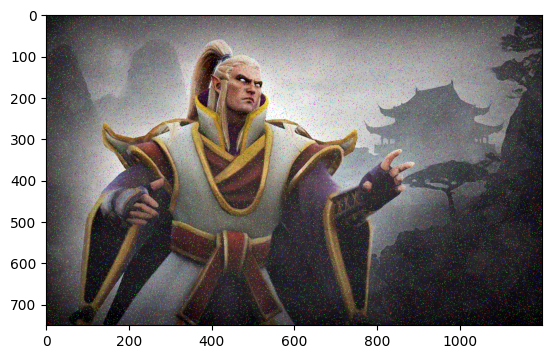

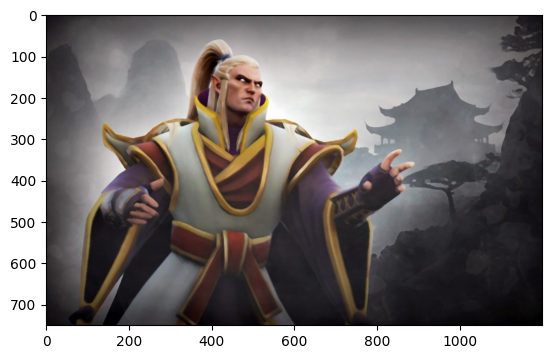

In [ ]:
# Взвешенный медианный фильтр при помощи ScYPY
image = cv2.imread("sample_image.png")
plt.imshow(image)
plt.show()
kernel = np.ones((5,5),np.float64)
imagecopy = image
imagecopy[:,:,0] = ndimage.median_filter(image[:,:,0], footprint=kernel)
imagecopy[:,:,1] = ndimage.median_filter(image[:,:,1], footprint=kernel)
imagecopy[:,:,2] = ndimage.median_filter(image[:,:,2], footprint=kernel)
plt.imshow(imagecopy)
plt.show()


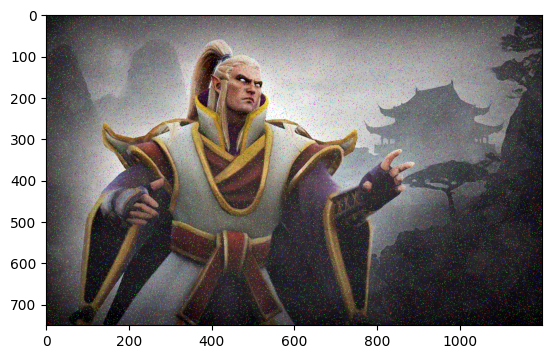

<ipython-input-34-84e2203a6bbc>:50: RuntimeWarning: divide by zero encountered in divide
  plane_2 = np.where(q < v, m, (plane_2 - m) * (1 - v / q) + m)
<ipython-input-34-84e2203a6bbc>:50: RuntimeWarning: invalid value encountered in multiply
  plane_2 = np.where(q < v, m, (plane_2 - m) * (1 - v / q) + m)


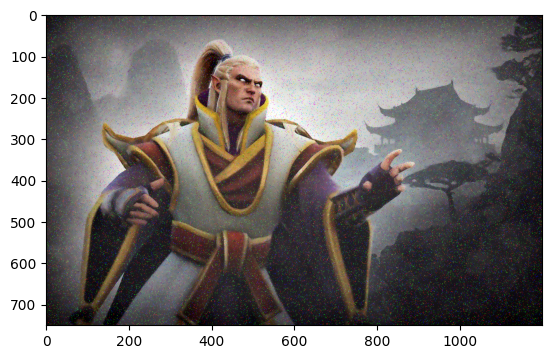

In [ ]:
#Винеровская фильтрация
image = cv2.imread("sample_image.png")
plt.imshow(image)
plt.show()
#image = image[:,:,0]
rows , cols = image.shape [0:2]
# Define parameters
k_size = (7, 7)
kernel = np.ones((k_size[0], k_size[1]))

# Convert to float and make image with border
if image.dtype == np.uint8:
    img_copy = image.astype(np.float32) / 255
else:
    img_copy = image
img_copy = cv2.copyMakeBorder(img_copy ,
                            int(( k_size[0] - 1) / 2) ,
                             int( k_size[0] / 2) ,
                             int(( k_size[1] - 1) / 2) ,
                             int( k_size[1] / 2) ,
                             cv2.BORDER_REPLICATE)

# Split into layers
bgr_planes = cv2.split(img_copy)
bgr_planes_2 = []
k_power = np.power(kernel, 2)

# For all layers
for plane in bgr_planes:
    # Calculate temporary matrices for I ** 2
    plane_power = np.power(plane, 2)
    m = np.zeros(image.shape[0:2], np.float32)
    q = np.zeros(image.shape[0:2], np.float32)

    # Calculate variance values
    for i in range(k_size[0]):
        for j in range(k_size[1]):
            m += kernel[i, j] * plane[i: i + rows, j:j+cols]
            q += k_power[i, j] * plane_power[i:i+rows, j:j+cols]

    m /= np.sum(kernel)
    q /= np.sum(kernel)
    q -= m * m

    # Calculate noise as an average variance
    v = np.sum(q) / image.size

    # Do filter
    plane_2 = plane[(k_size[0] - 1) // 2:(k_size[0] - 1) // 2 + rows, (k_size[1] - 1) // 2:(k_size[1] - 1) // 2 + cols]
    plane_2 = np.where(q < v, m, (plane_2 - m) * (1 - v / q) + m)
    bgr_planes_2.append(plane_2)

# Merge image back
I_out = cv2.merge(bgr_planes_2)

# Convert back to uint if needed
if image.dtype == np.uint8:
    I_out = (255 * I_out).clip(0, 255).astype(np.uint8)
plt.imshow(I_out)
plt.show()

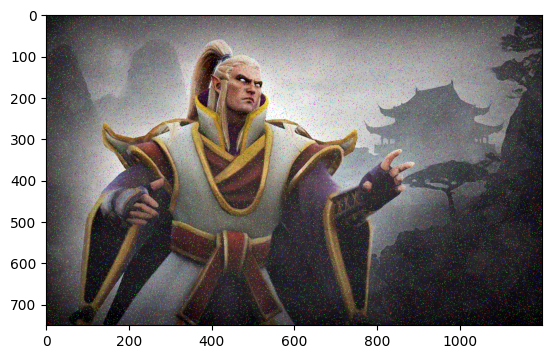

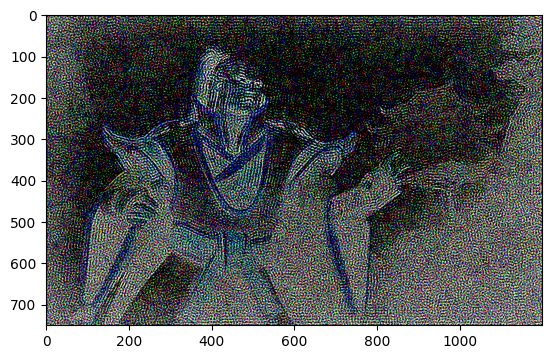

In [ ]:
# Винеровская фильрация при помощи scypy
image = cv2.imread("sample_image.png")
plt.imshow(image)
plt.show()
size = 7
kernel = np.ones((size,size), np.float64) / size**2
imagecopy = image
imagecopy[:,:,0] = skimage.restoration.wiener(image[:,:,0], kernel, 0.001)
imagecopy[:,:,1] = skimage.restoration.wiener(image[:,:,1], kernel, 0.001)
imagecopy[:,:,2] = skimage.restoration.wiener(image[:,:,2], kernel, 0.001)
plt.imshow(imagecopy)
plt.show()


Высокочастотная фильтрация

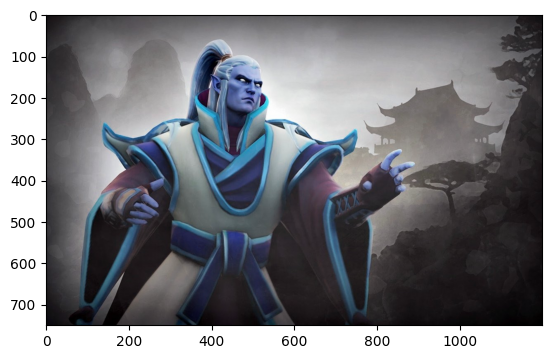

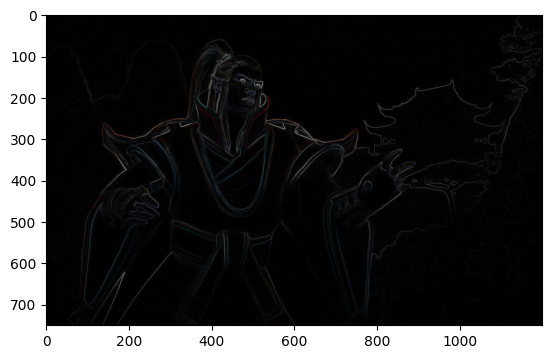

In [ ]:
#Фильтр Робертса
imageObj = cv2.imread('обработка.jpg')
plt.imshow(imageObj)
plt.show()
G_x = np.array([[1, 0], [0, -1]])
G_y = np.array([[0, 1], [-1, 0]])
I_x = cv2.filter2D(imageObj, cv2.CV_32F, G_x)
I_y = cv2.filter2D(imageObj, cv2.CV_32F, G_y)
I_out = cv2.magnitude(I_x, I_y)
I_out = np.clip(np.round(I_out), 0, 255).astype(dtype=np.uint8)
plt.imshow(I_out)
plt.show()

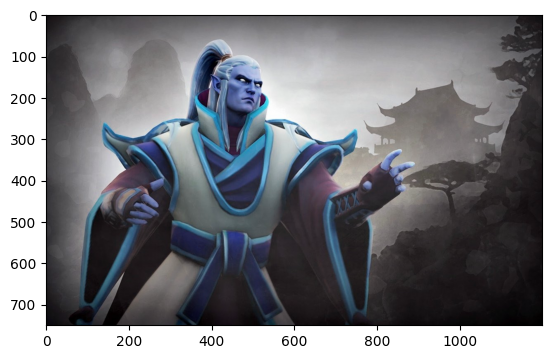

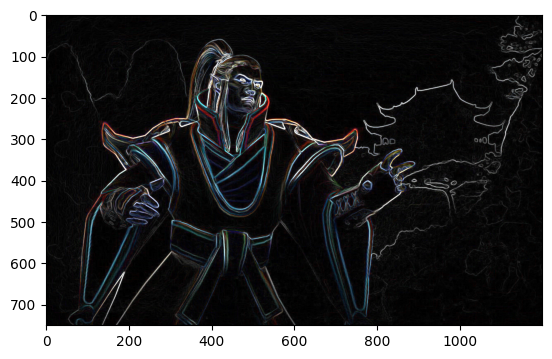

In [ ]:
#Фильтр Превитта
imageObj = cv2.imread('обработка.jpg')
plt.imshow(imageObj)
plt.show()
G_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
G_y = np.array([[-1, -1, -1], [0, 0, 0],[1, 1, 1]])
I_x = cv2.filter2D(imageObj, cv2.CV_32F, G_x)
I_y = cv2.filter2D(imageObj, cv2.CV_32F, G_y)
I_out = cv2.magnitude(I_x, I_y)
I_out = np.clip(np.round(I_out), 0, 255).astype(dtype=np.uint8)
plt.imshow(I_out)
plt.show()


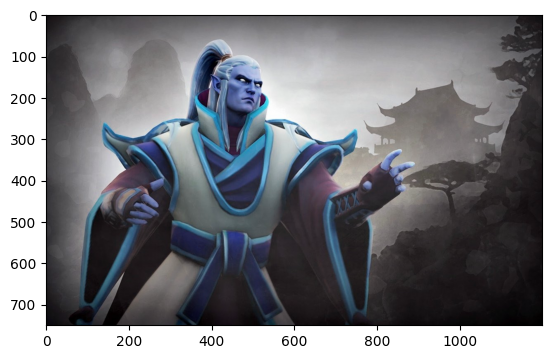

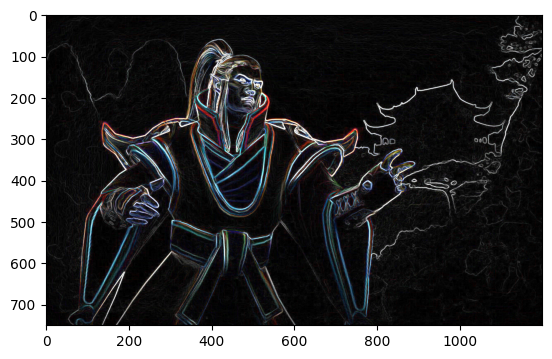

In [ ]:
#Фильтр Собела
# Можно использовать другие матрицы в фильтре Преввита и получить фильтр собеля
#но будем использовать cv2.SOBEL
imageObj = cv2.imread('обработка.jpg')
plt.imshow(imageObj)
plt.show()

gx = cv2.Sobel(np.float32(imageObj), cv2.CV_32F, 1, 0)
gy = cv2.Sobel(np.float32(imageObj), cv2.CV_32F, 0, 1)
result_1, result_2 = cv2.cartToPolar(gx, gy)
result_1 = np.clip(np.round(result_1), 0, 255).astype(dtype=np.uint8)
plt.imshow(result_1)
plt.show()


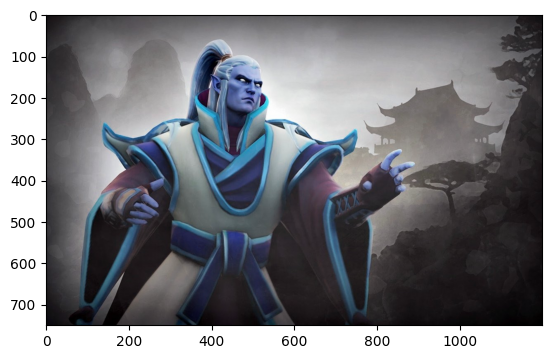

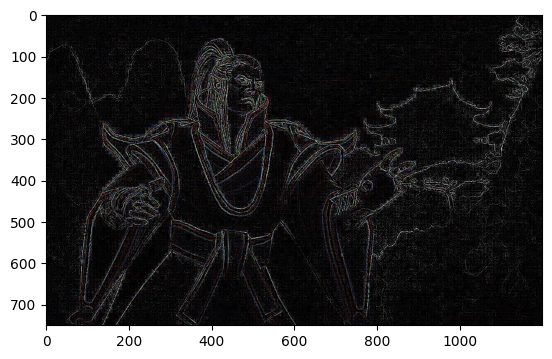

In [ ]:
#Фильтр Лапласа
# задаим ядро Оператор Лапласа 1 порядка
imageObj = cv2.imread('обработка.jpg')
plt.imshow(imageObj)
plt.show()

kernel_Lapl = np.array([
    [0, 1, 0],
    [1, -4, 1],
    [0, 1, 0]])
kernel_coef = 10

lapl_izobr = 10 * cv2.filter2D(imageObj, -1, kernel_Lapl)
#lapl_izobr = np.clip(np.round(lapl_izobr), 0, 255).astype(dtype=np.uint8)
plt.imshow(lapl_izobr)
plt.show()


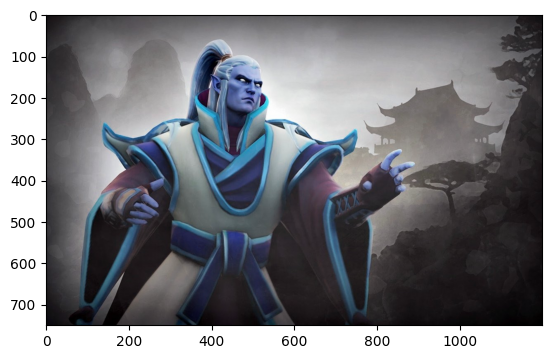

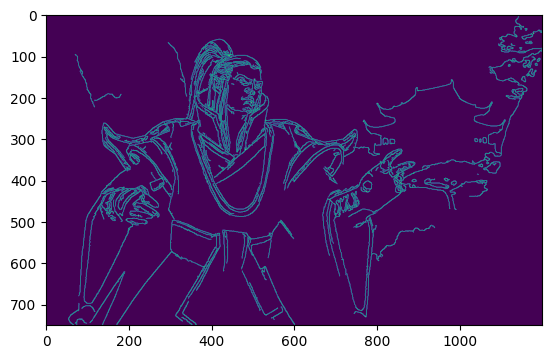

In [ ]:
#Алгоритм Кэнни
imageObj = cv2.imread('обработка.jpg')
plt.imshow(imageObj)
plt.show()
t_1 = 50
t_2 = 150
I_out = cv2.Canny(imageObj, t_1, t_2)
plt.imshow(I_out)
plt.show()
